# Table agrégée commune année : exemple des nitrites

## 1. Introduction et récupération des données brutes

Ce Notebook vise à compléter la partie nitrite de la tâche 167 
[définie ici](https://noco.services.dataforgood.fr/dashboard/#/nc/pk1vq1pm8frc5lm/ms9uz8er4jpow7j/Tasks%20data%20analyst?rowId=167)


Ce faisant, nous définissions plusieurs fonctions d'appoint orientées Python/Pandas pour ingérer et traiter les bases de données afin de récupérer aisément les colonnes de polluants correspondant à la catégorie désirée.


On commence par récupérer les tables.

On utilise la BDD locale pour les prélèvements.

Pour l'appariement des catégories, la Google sheet utilisée (à croiser avec l'autre de GF) sera  :
https://docs.google.com/spreadsheets/d/1W239EkEV72WzzefB6jbYUQkIIQ-9xa4u9_m8XdCpU4o/edit?gid=973653272#gid=973653272



In [1]:
import pandas as pd
import duckdb
from pipelines.tasks.config.common import DUCKDB_FILE

pd.set_option("display.max_columns", None)  # show all cols
con = duckdb.connect(database=DUCKDB_FILE, read_only=True)

results=con.table("edc_resultats")

con.execute("SHOW TABLES").df()

,name
0,cog_communes
1,edc_communes
2,edc_prelevements
3,edc_resultats
4,laposte_communes


In [2]:
def fetch_google_sheet():
    # Récupère la google sheet, adapté de :
    # https://medium.com/@Bwhiz/step-by-step-guide-importing-google-sheets-data-into-pandas-ae2df899257f
    sheet_id = '1W239EkEV72WzzefB6jbYUQkIIQ-9xa4u9_m8XdCpU4o' # replace with your sheet's ID
    url = f"https://docs.google.com/spreadsheets/d/{sheet_id}/gviz/tq?tqx=out:csv"
    return pd.read_csv(url)


def get_map_cat(cle: str="cdparametresiseeaux"):
    # Ajoute à la gsheet les seuils récupérés de limitequal dans edc_resultats
    # On fait un merge assez sauvage qui ne garde que les cas qui se passent bien.
    dfgsheet=fetch_google_sheet()
    dfseuil=results.select(cle, "limitequal").distinct().df().dropna()
    dfseuil["limit"]=dfseuil["limitequal"].str.replace(",", ".").str.extract(r"([\d.]+)").astype(float)
    return dfgsheet.merge(dfseuil[[cle, "limit"]])

dfmapcat=get_map_cat()
dfmapcat.groupby("categorie").first()


,cdparametresiseeaux,cdparametre,libmajparametre,libminparametre,casparam,limit
categorie,,,,,,
cvm,CLVYL,1753.0,CHLORURE DE VINYL MONOMÈRE,Chlorure de vinyl monomère,75-01-4,0.50
hap,BAPYR,1115.0,BENZO(A)PYRÈNE *,Benzo(a)pyrène *,50-32-8,0.01
hydrocarbures,BENZ,1114.0,BENZÈNE,Benzène,71-43-2,1.00
microbio,STRF,6455.0,ENTÉROCOQUES /100ML-MS,Entérocoques /100ml-MS,101043-37-2,0.00
minéral,FMG,7073.0,FLUORURES MG/L,Fluorures mg/L,16984-48-8,1.50
métabolite de pesticide,ADET,1108.0,ATRAZINE DÉSÉTHYL,Atrazine déséthyl,6190-65-4,0.10
métaux lourds,AS,1369.0,ARSENIC,Arsenic,7440-38-2,10.00
nitrite,NO3,1340.0,NITRATES (EN NO3),Nitrates (en NO3),14797-55-8,50.00
non classé,ACRYL,1457.0,ACRYLAMIDE,Acrylamide,79-06-1,0.10


## 2. Fonctions de pivot

Les fonctions suivantes permettent d'obtenir la table correspondant aux catégories souhaitées.
* pivot_resultats_pour_categories fait pivoter la table des résultats en filtrant pour ne garder que les colonnes précisées dans categories
* calcul_depassements ajoute les colonnes précisant si les seuils sont dépassés en utilisant les seuils de edc_resultats (pas utilisé ici)
* fusion_prel_pivot_resultats fusionne avec la table edc_prelevements sur referenceprel en ajoutant les colonnes prel_col


In [3]:
def pivot_resultats_pour_categories(categories: list,
                                    index:str="referenceprel",
                                    columns:str="cdparametresiseeaux",
                                    values:str='valtraduite'):
    rel=results.select(index, columns, values).filter(f"{columns} in {categories}")
    dfpiv=rel.df().drop_duplicates(subset=[index, columns]).pivot(index=index, columns=columns)
    dfpiv.columns=[multilevel[1] for multilevel in dfpiv.columns]
    return dfpiv

def calcul_depassements(dseuil: dict):
    """ dseuil: dict of categorie(str): seuil(float)
    return 
    """
    dfpiv=pivot_resultats_pour_categories(list(dseuil.keys()))
    for col, seuil in dseuil.items():
        dfpiv["b_"+col] = dfpiv[col]>seuil
    return dfpiv

def fusion_prel_pivot_resultats(dfpiv,
                                prel_col=["inseecommuneprinc", "nomcommuneprinc", "dateprel", "de_partition"]):
    ref_col="referenceprel"
    dfprel=con.table("edc_prelevements").select(ref_col, *prel_col).df().drop_duplicates(subset=ref_col).set_index(ref_col)
    dfmerge=dfprel.merge(dfpiv, left_index=True, right_index=True, validate="one_to_one")
    return dfmerge

## 3. Application aux nitrites


Nous voulons maintenant avoir les résultats pour les nitrites.
Les détails de ce qu'on veut sont disponibles sur [ce Google Doc](https://docs.google.com/document/d/1foeVEWU6Kf12Fo-_Vj3vVwyE-3LXGzZPlofEYDCcstk/edit?tab=t.0)

Besoin de 

* Filtre temporel
    * (à choisir en premier)
    * Résultats des dernières analyses
    * OU Bilan annuel (2020 -> 2024)
    * pour le moment seul "résultat des dernières analyses" est décrit, on se concentre là-dessus.


* Filtres par catégories de polluants [Lien Google Sheets](https://docs.google.com/spreadsheets/d/1a5ywbeeu5_T8F3707wIC8WX86_0577wK/edit?usp=sharing&ouid=115470011005689616061&rtpof=true&sd=true )
    * pour rappel cf. première cellule on utilise un autre tableau Google Sheet, plus commode
    * L'affichage dépend du type de polluant sélectionné
    * Ce notebook : nitrites et nitrates


* Si une commune contient plusieurs UDI, le résultat pire cas est affiché (une seule UDI dépasse une norme, la commune passe en orange / rouge)
    -> pas traité ici


* Nitrites, 5 situations:
    * Nitrates < 25 mg/L et nitrites < 0,5 mg/L (eau conforme)
    * Nitrates entre 25 et 40 mg/L et nitrites < 0,5 mg/L (eau conforme)
    * Nitrates entre 40 et 50 mg/L et nitrites < 0,5 mg/L (eau conforme)
    * Nitrates entre 50 et 100 mg/L et/ou nitrites > 0,5 mg/L (eau non conforme) (fait passer l’affichage total polluant en rouge)
    * Nitrates > 100 mg/L et/ou nitrites > 0,5 mg/L (eau non conforme) (fait passer l’affichage total polluant en rouge)


In [4]:
dfnitrite=dfmapcat.query("categorie=='nitrite'")
dfnitrite

,cdparametresiseeaux,cdparametre,libmajparametre,libminparametre,casparam,categorie,limit
780,NO3,1340.0,NITRATES (EN NO3),Nitrates (en NO3),NaN,nitrite,50.0
781,NO3_NO2,6374.0,NITRATES/50 + NITRITES/3,Nitrates/50 + Nitrites/3,NaN,nitrite,1.0
782,NO2,1339.0,NITRITES (EN NO2),Nitrites (en NO2),NaN,nitrite,0.1
783,NO2,1339.0,NITRITES (EN NO2),Nitrites (en NO2),NaN,nitrite,0.5
784,NO3,1340.0,NITRATES (EN NO3),Nitrates (en NO3),14797-55-8,nitrite,50.0
785,NO2,1339.0,NITRITES (EN NO2),Nitrites (en NO2),14797-65-0,nitrite,0.1
786,NO2,1339.0,NITRITES (EN NO2),Nitrites (en NO2),14797-65-0,nitrite,0.5


In [5]:
dfpiv=pivot_resultats_pour_categories(["NO3", "NO2", "NO3_NO2"])
dffus=fusion_prel_pivot_resultats(dfpiv)
dffus

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,inseecommuneprinc,nomcommuneprinc,dateprel,de_partition,NO2,NO3,NO3_NO2
referenceprel,,,,,,,
00100119766,01007,AMBRONAY,2020-02-13,2020,0.0,19.60,NaN
00100120290,01007,AMBRONAY,2020-03-17,2020,0.0,16.90,NaN
00100120717,01007,AMBRONAY,2020-05-14,2020,NaN,16.90,NaN
00100121072,01007,AMBRONAY,2020-06-11,2020,NaN,14.30,NaN
00100121547,01007,AMBRONAY,2020-07-08,2020,NaN,15.30,NaN
...,...,...,...,...,...,...,...
97600031877,97615,PAMANDZI,2024-07-09,2024,NaN,0.63,NaN
97600031878,97615,PAMANDZI,2024-07-09,2024,NaN,0.54,NaN
97600031996,97615,PAMANDZI,2024-07-30,2024,NaN,0.24,NaN


In [6]:
# Y a-t-il des cas où on n'a pas NO2 mais NO3_NO2 ?
dffus[(dffus["NO2"].isna()) & (~dffus["NO3_NO2"].isna())]

,inseecommuneprinc,nomcommuneprinc,dateprel,de_partition,NO2,NO3,NO3_NO2
referenceprel,,,,,,,
05500108681,55060,BONZEE,2020-10-21,2020,NaN,4.3,0.17
09200127399,95394,MERY-SUR-OISE,2020-12-09,2020,NaN,20.0,0.40
09200127409,95394,MERY-SUR-OISE,2020-06-30,2020,NaN,23.5,0.47
09200127410,95394,MERY-SUR-OISE,2020-08-21,2020,NaN,19.0,0.38
09200127465,95394,MERY-SUR-OISE,2020-11-04,2020,NaN,18.0,0.36
...,...,...,...,...,...,...,...
07100123511,71162,CURGY,2024-02-07,2024,NaN,26.0,0.52
07100124821,71162,CURGY,2024-06-17,2024,NaN,23.0,0.46
07100125609,71162,CURGY,2024-08-12,2024,NaN,26.0,0.52


In [7]:
# Y a-t-il des cas où on n'a pas NO3 mais NO3_NO2 ?
dffus[(dffus["NO3"].isna()) & (~dffus["NO3_NO2"].isna())]

,inseecommuneprinc,nomcommuneprinc,dateprel,de_partition,NO2,NO3,NO3_NO2
referenceprel,,,,,,,
04100094106,41045,CHAUMONT-SUR-LOIRE,2020-08-24,2020,0.02,NaN,0.550
04100092311,41090,FORTAN,2020-01-31,2020,0.00,NaN,0.150
05000160164,50289,MARCHESIEUX,2020-03-26,2020,0.00,NaN,0.146
05000160408,50158,CUVES,2020-04-21,2020,0.00,NaN,0.826
05000160301,50428,REFFUVEILLE,2020-03-18,2020,0.00,NaN,0.504
...,...,...,...,...,...,...,...
08600131362,86266,SURIN,2024-06-19,2024,0.00,NaN,0.500
08600130258,86297,VOUNEUIL-SOUS-BIARD,2024-03-27,2024,0.00,NaN,0.780
08600131657,86297,VOUNEUIL-SOUS-BIARD,2024-07-17,2024,0.00,NaN,0.820


In [8]:
# Y a-t-il des cas où on n'a ni NO2 ni NO3 mais NO3_NO2 ? (tant pis pour eux...)
dffus[(dffus["NO2"].isna()) & (dffus["NO3"].isna()) & (~dffus["NO3_NO2"].isna())]

,inseecommuneprinc,nomcommuneprinc,dateprel,de_partition,NO2,NO3,NO3_NO2
referenceprel,,,,,,,
04400227327,44025,CAMPBON,2021-12-16,2021,NaN,NaN,0.000
04400227528,44110,NORT-SUR-ERDRE,2021-12-14,2021,NaN,NaN,1.000
05000164768,50571,SEBEVILLE,2021-02-15,2021,NaN,NaN,0.207
07200128017,72181,MANS (LE),2022-01-24,2022,NaN,NaN,0.440
07200127997,72176,LUDE (LE),2022-01-24,2022,NaN,NaN,0.016
07200128004,72115,DISSAY-SOUS-COURCILLON,2022-01-24,2022,NaN,NaN,0.013
07200127989,72039,BONNETABLE,2022-01-25,2022,NaN,NaN,0.068
07200128005,72175,LUCHE-PRINGE,2022-01-24,2022,NaN,NaN,0.000
07200127981,72328,SARGE-LES-LE-MANS,2022-01-25,2022,NaN,NaN,0.000


array([[<Axes: title={'center': 'NO3'}>, <Axes: title={'center': 'NO2'}>]],
      dtype=object)

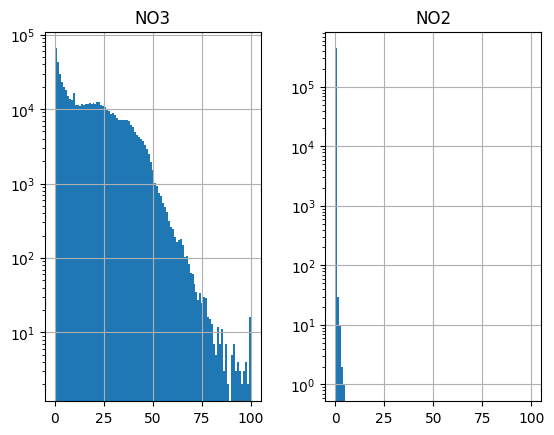

In [9]:
# On regarde les distributions des paramètres d'intérêt

import numpy as np
dffus[["NO3", "NO2"]].hist(bins=np.linspace(0, 100, 100), log=True)


### Calcul de l'arbre de décision

On définit une catégorie pour chaque cas :
* 0:    Pas de données pour NO2 et NO3 (si un seul disponible on consière que l'autre est à 0 (!!!)
* 1:    Nitrates < 25 mg/L et nitrites < 0,5 mg/L (eau conforme)
* 2:    Nitrates entre 25 et 40 mg/L et nitrites < 0,5 mg/L (eau conforme)
* 3:    Nitrates entre 40 et 50 mg/L et nitrites < 0,5 mg/L (eau conforme)
* 4:    Nitrates entre 50 et 100 mg/L et/ou nitrites > 0,5 mg/L (eau non conforme) (fait passer l’affichage total polluant en rouge)
* 5:    Nitrates > 100 mg/L et/ou nitrites > 0,5 mg/L (eau non conforme) (fait passer l’affichage total polluant en rouge)


In [10]:
def complete_nitrite_nitrate(row):
    NO2 = row["NO2"] 
    NO3 = row["NO3"] 
    NO3_NO2 = row["NO3_NO2"] #Nitrates/50 + Nitrites/3 	= NO3/50 + N02/3
    if np.isnan(NO2) and np.isnan(NO2):
        return None, None
    if np.isnan(NO2):
        NO2 = 0 if np.isnan(NO3_NO2) else 3*(NO3_NO2-NO3/50)
    if np.isnan(NO3):
        NO3 = 0 if np.isnan(NO3_NO2) else 50*(NO3_NO2-NO2/3)
    return NO2, NO3

def arbre_decision(row):
    nitrite, nitrate=complete_nitrite_nitrate(row)
    if nitrate is None and nitrite is None:   return 0
    elif nitrate < 25 and nitrite < 0.5:      return 1
    elif nitrate < 40 and nitrite < 0.5:      return 2
    elif nitrate < 50 and nitrite < 0.5:      return 3
    elif nitrate > 100 or nitrite >= 0.5:     return 5 #!
    else:  return 4


dffus["resultat"]=dffus.apply(arbre_decision, axis=1)
dffus

,inseecommuneprinc,nomcommuneprinc,dateprel,de_partition,NO2,NO3,NO3_NO2,resultat
referenceprel,,,,,,,,
00100119766,01007,AMBRONAY,2020-02-13,2020,0.0,19.60,NaN,1
00100120290,01007,AMBRONAY,2020-03-17,2020,0.0,16.90,NaN,1
00100120717,01007,AMBRONAY,2020-05-14,2020,NaN,16.90,NaN,0
00100121072,01007,AMBRONAY,2020-06-11,2020,NaN,14.30,NaN,0
00100121547,01007,AMBRONAY,2020-07-08,2020,NaN,15.30,NaN,0
...,...,...,...,...,...,...,...,...
97600031877,97615,PAMANDZI,2024-07-09,2024,NaN,0.63,NaN,0
97600031878,97615,PAMANDZI,2024-07-09,2024,NaN,0.54,NaN,0
97600031996,97615,PAMANDZI,2024-07-30,2024,NaN,0.24,NaN,0


## 4. Sanity check et visualisation des résultats

On garde uniquement les prélévements qui ont des résultats > 0, et la date du dernier prélèvement.

On affiche selon un code couleur qui va bien.

In [11]:
dfres=dffus.query("resultat>0")\
           .sort_values(["dateprel", "inseecommuneprinc"])\
           .groupby("inseecommuneprinc", as_index=False).last()
dfres.resultat.value_counts()

resultat
1    22612
2     4225
3     1299
4      274
5        2
Name: count, dtype: int64

In [12]:
!uv pip install geopandas shapely folium matplotlib mapclassify seaborn

Using Python 3.12.7 environment at /home/laurent/Code/13_pollution_eau/.venv
Audited 6 packages in 18ms


In [13]:
import seaborn as sns
pal=sns.color_palette("hls", 10)
pal

[(0.86, 0.3712, 0.33999999999999997),
 (0.86, 0.6832, 0.33999999999999997),
 (0.7247999999999999, 0.86, 0.33999999999999997),
 (0.41279999999999994, 0.86, 0.33999999999999997),
 (0.33999999999999997, 0.86, 0.5792000000000002),
 (0.33999999999999997, 0.8287999999999999, 0.86),
 (0.33999999999999997, 0.5167999999999995, 0.86),
 (0.4752000000000003, 0.33999999999999997, 0.86),
 (0.7871999999999999, 0.33999999999999997, 0.86),
 (0.86, 0.33999999999999997, 0.6207999999999999)]

In [14]:
import geopandas as gpd
from shapely.geometry import Point
cmap=pal.as_hex()[:5][::-1] # On garde les 5 premières couleurs, inversées pour aller du vert au rouge
dfgeo=con.table("laposte_communes").df()[["code_commune_insee", "_geopoint"]].set_index("code_commune_insee").dropna()
dgeo={k: Point(eval(v["_geopoint"])[::-1]) for k, v in dfgeo.iterrows()}
dfg=gpd.GeoDataFrame(data=dfres, geometry=dfres["inseecommuneprinc"].map(dgeo), crs="WGS84")
dfg

,inseecommuneprinc,nomcommuneprinc,dateprel,de_partition,NO2,NO3,NO3_NO2,resultat,geometry
0,01001,ABERGEMENT-CLEMENCIAT (L'),2024-02-09,2024,0.0,NaN,NaN,1,POINT (4.9306 46.1517)
1,01002,ABERGEMENT-DE-VAREY (L'),2024-10-17,2024,0.0,3.30,0.07,1,POINT (5.42464 46.00713)
2,01004,AMBERIEU-EN-BUGEY,2024-12-26,2024,0.0,5.00,0.10,1,POINT (5.37057 45.95747)
3,01005,AMBERIEUX-EN-DOMBES,2023-02-13,2023,0.0,NaN,NaN,1,POINT (4.91187 45.99923)
4,01006,AMBLEON,2024-12-13,2024,0.0,5.30,0.11,1,POINT (5.59278 45.74831)
...,...,...,...,...,...,...,...,...,...
28407,97616,SADA,2020-01-21,2020,0.0,NaN,NaN,1,POINT (45.11344 -12.86427)
28408,97617,TSINGONI,2024-07-02,2024,0.0,0.76,NaN,1,POINT (45.1334 -12.78237)
28409,97701,SAINT-BARTHELEMY,2024-10-14,2024,0.0,0.00,NaN,1,None
28410,97801,SAINT-MARTIN,2024-11-27,2024,0.0,0.00,NaN,1,None


In [15]:
dfg.explore(column="resultat", categorical=True, cmap=cmap, marker_type='circle')